## Resume Classification(Data Processing using NLP)

In [1]:
import numpy as np
import pandas as pd

import nltk
from nltk.corpus import stopwords
import string

import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline


In [2]:
import warnings
warnings.filterwarnings("ignore")

### Loading datasets

In [3]:
df = pd.read_csv('Resume_Data.csv' ,encoding='utf-8')
df.head()

,Category,Resume
0,Data Science,Skills * Programming Languages: Python (pandas...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...
2,Data Science,"Areas of Interest Deep Learning, Control Syste..."
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab..."


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 962 entries, 0 to 961
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  962 non-null    object
 1   Resume    962 non-null    object
dtypes: object(2)
memory usage: 15.2+ KB


In [5]:
df.isna().sum()

Category    0
Resume      0
dtype: int64

### Distinct values of the dataset

In [6]:
print ("Resume Categories")
print (df['Category'].value_counts())

Resume Categories
Java Developer               84
Testing                      70
DevOps Engineer              55
Python Developer             48
Web Designing                45
HR                           44
Hadoop                       42
Blockchain                   40
ETL Developer                40
Operations Manager           40
Data Science                 40
Sales                        40
Mechanical Engineer          40
Arts                         36
Database                     33
Electrical Engineering       30
Health and fitness           30
PMO                          30
Business Analyst             28
DotNet Developer             28
Automation Testing           26
Network Security Engineer    25
SAP Developer                24
Civil Engineer               24
Advocate                     20
Name: Category, dtype: int64


In [7]:
print ("Displaying the distinct categories of resume:\n\n ")
print (df['Category'].unique())

Displaying the distinct categories of resume:

 
['Data Science' 'HR' 'Advocate' 'Arts' 'Web Designing'
 'Mechanical Engineer' 'Sales' 'Health and fitness' 'Civil Engineer'
 'Java Developer' 'Business Analyst' 'SAP Developer' 'Automation Testing'
 'Electrical Engineering' 'Operations Manager' 'Python Developer'
 'DevOps Engineer' 'Network Security Engineer' 'PMO' 'Database' 'Hadoop'
 'ETL Developer' 'DotNet Developer' 'Blockchain' 'Testing']


### Data Visualizations

<AxesSubplot:xlabel='count', ylabel='Category'>

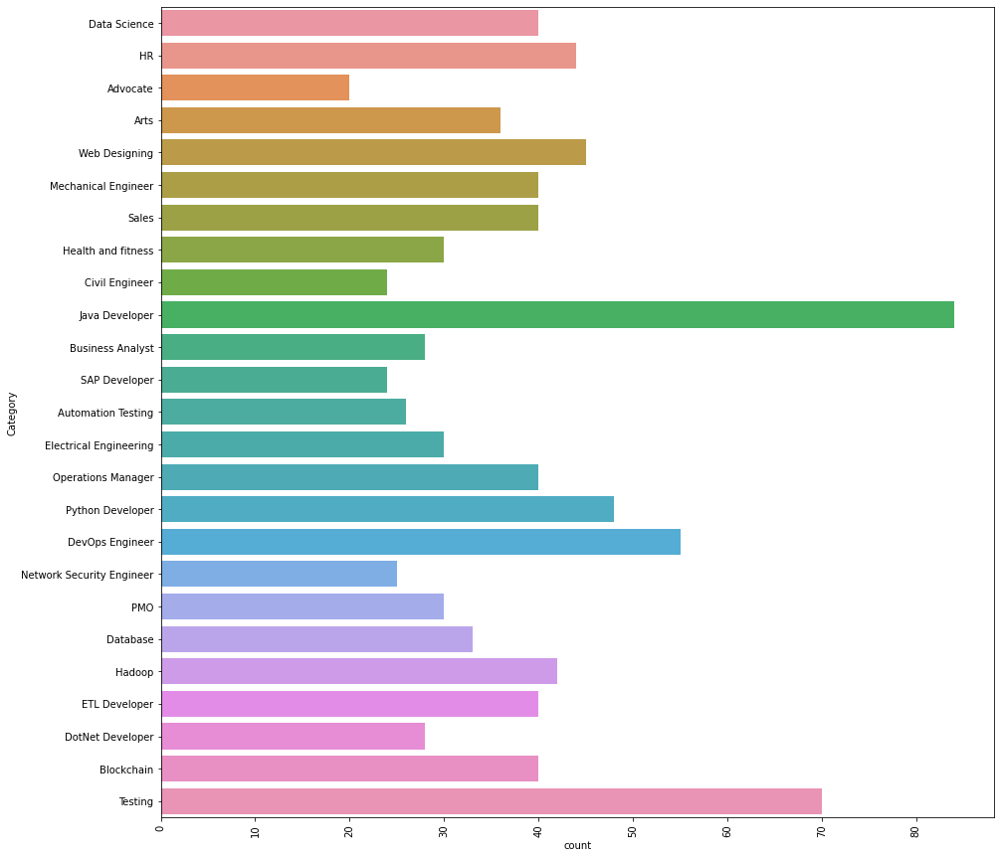

In [8]:
plt.figure(figsize=(15,15))
plt.xticks(rotation=90)
sns.countplot(y="Category", data=df)

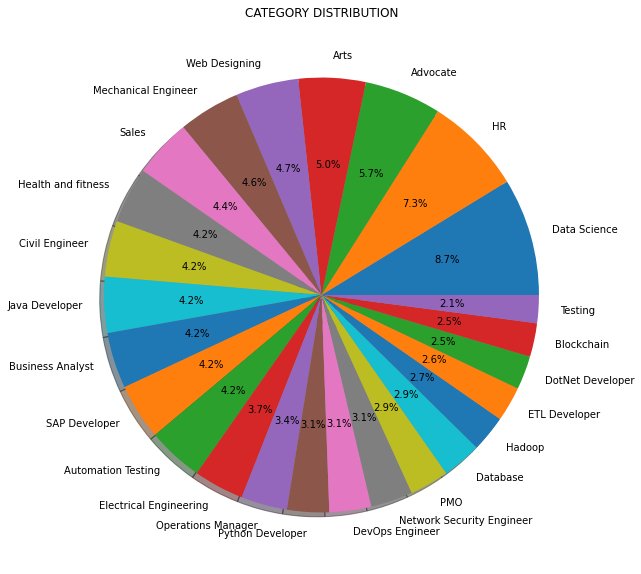

In [9]:
from matplotlib.gridspec import GridSpec
targetCounts = df['Category'].value_counts()
targetLabels  = df['Category'].unique()

plt.figure(1, figsize=(22,22))
the_grid = GridSpec(2, 2)


cmap = plt.get_cmap('coolwarm')
plt.subplot(the_grid[0, 1], aspect=1, title='CATEGORY DISTRIBUTION')

source_pie = plt.pie(targetCounts, labels=targetLabels, autopct='%1.1f%%', shadow=True)
plt.show()

In [10]:
df["Resume"][7]

'Education Details \r\n B.Tech   Rayat and Bahra Institute of Engineering and Biotechnology\r\nData Science \r\n\r\nData Science\r\nSkill Details \r\nNumpy- Exprience - Less than 1 year months\r\nMachine Learning- Exprience - Less than 1 year months\r\nTensorflow- Exprience - Less than 1 year months\r\nScikit- Exprience - Less than 1 year months\r\nPython- Exprience - Less than 1 year months\r\nGCP- Exprience - Less than 1 year months\r\nPandas- Exprience - Less than 1 year months\r\nNeural Network- Exprience - Less than 1 year monthsCompany Details \r\ncompany - Wipro\r\ndescription - Bhawana Aggarwal\r\nE-Mail:bhawana.chd@gmail.com\r\nPhone: 09876971076\r\nVVersatile, high-energy professional targeting challenging assignments in Machine\r\nPROFILE SUMMARY\r\nâ\x96ª An IT professional with knowledge and experience of 2 years in Wipro Technologies in Machine\r\nLearning, Deep Learning, Data Science, Python, Software Development.\r\nâ\x96ª Skilled in managing end-to-end development and 

### Data Cleaning

In [11]:
import re
def cleanResume(resumeText):
    resumeText = re.sub('http\S+\s*', ' ', resumeText)  # remove URLs
    resumeText = re.sub('RT|cc', ' ', resumeText)  # remove RT and cc
    resumeText = re.sub('#\S+', '', resumeText)  # remove hashtags
    resumeText = re.sub('@\S+', '  ', resumeText)  # remove mentions
    resumeText = re.sub('[%s]' % re.escape("""!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~"""), ' ', resumeText)  # remove punctuations
    resumeText = re.sub(r'[^\x00-\x7f]',r' ', resumeText) 
    resumeText = re.sub('\s+', ' ', resumeText)  # remove extra whitespace
    return resumeText
    
df['Cleaned_Resume'] = df.Resume.apply(lambda x: cleanResume(x))

In [12]:
df

,Category,Resume,Cleaned_Resume
0,Data Science,Skills * Programming Languages: Python (pandas...,Skills Programming Languages Python pandas num...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...,Education Details May 2013 to May 2017 B E UIT...
2,Data Science,"Areas of Interest Deep Learning, Control Syste...",Areas of Interest Deep Learning Control System...
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...,Skills R Python SAP HANA Tableau SAP HANA SQL ...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab...",Education Details MCA YMCAUST Faridabad Haryan...
...,...,...,...
957,Testing,Computer Skills: â¢ Proficient in MS office (...,Computer Skills Proficient in MS office Word B...
958,Testing,â Willingness to accept the challenges. â ...,Willingness to a ept the challenges Positive ...
959,Testing,"PERSONAL SKILLS â¢ Quick learner, â¢ Eagerne...",PERSONAL SKILLS Quick learner Eagerness to lea...
960,Testing,COMPUTER SKILLS & SOFTWARE KNOWLEDGE MS-Power ...,COMPUTER SKILLS SOFTWARE KNOWLEDGE MS Power Po...


In [13]:
df.reset_index(inplace=True)

In [14]:
df.shape

(962, 4)

## Text Summarization

In [15]:
from transformers import GPT2Tokenizer,GPT2LMHeadModel

In [16]:
tokenizer=GPT2Tokenizer.from_pretrained('gpt2')
model=GPT2LMHeadModel.from_pretrained('gpt2')

In [17]:
summarised_resumes = []
for i in range(len(df['Cleaned_Resume'])):
    original_text = df['Cleaned_Resume'][i]
    inputs = tokenizer.batch_encode_plus([original_text],return_tensors='pt',max_length=1000)
    summary_ids = model.generate(inputs['input_ids'],early_stopping=True)
    summary_txt = tokenizer.decode(summary_ids[0],skip_special_tokens=True)
    summarised_resumes.append(summary_txt)

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 825, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 229, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 341, but ``max_length`` is set

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 341, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 85, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 132, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting 

Input length of input_ids is 30, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 30, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 21, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 20, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 129, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 88, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 217, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 98, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `p

Input length of input_ids is 107, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 188, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 283, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 166, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input le

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 634, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 584, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 111, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 617, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting 

Input length of input_ids is 259, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 324, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 92, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input le

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 297, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 164, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 136, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 217, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting 

Input length of input_ids is 132, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 387, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 391, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 278, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input le

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 134, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 77, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 572, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting 

Input length of input_ids is 49, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 405, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 388, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 452, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input len

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 263, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 263, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 337, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 196, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting 

Input length of input_ids is 691, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 122, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 300, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 414, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input le

Input length of input_ids is 617, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 200, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 189, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 460, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input le

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 384, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 489, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 831, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 734, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting 

Input length of input_ids is 431, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 836, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 65, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 742, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input len

Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Inpu

Input length of input_ids is 535, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 423, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 206, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 543, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input le

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 324, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 873, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 682, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting

Input length of input_ids is 760, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 324, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 873, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 760, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input le

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 627, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 500, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 816, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 846, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 429, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 846, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting

Input length of input_ids is 963, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 522, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 393, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 629, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input le

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 317, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 886, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 706, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting

Input length of input_ids is 872, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 333, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 945, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 226, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input le

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 65, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 687, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 1000, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 322, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting 

Input length of input_ids is 253, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 464, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 250, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 580, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input le

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 355, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 353, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 535, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 136, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting 

Input length of input_ids is 118, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 350, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 355, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 353, but ``max_length`` is set to 20.This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input le

In [18]:
df['Summarised_Resume'] = summarised_resumes

In [19]:
df['Summarised_Resume'][7]

'Education Details B Tech Rayat and Bahra Institute of Engineering and Biotechnology Data Science Data Science Skill Details Numpy Exprience Less than 1 year months Machine Learning Exprience Less than 1 year months Tensorflow Exprience Less than 1 year months Scikit Exprience Less than 1 year months Python Exprience Less than 1 year months GCP Exprience Less than 1 year months Pandas Exprience Less than 1 year months Neural Network Exprience Less than 1 year monthsCompany Details company Wipro description Bhawana Aggarwal E Mail bhawana chd Phone 09876971076 VVersatile high energy professional targeting challenging assignments in Machine PROFILE SUMMARY An IT professional with knowledge and experience of 2 years in Wipro Technologies in Machine Learning Deep Learning Data Science Python Software Development Skilled in managing end to end development and software products projects from inception requirement specs planning designing implementation configuration and documentation Knowled

In [20]:
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.lancaster import LancasterStemmer
from nltk.stem.porter import PorterStemmer
from nltk.corpus import stopwords
import string

#### Removing the numeric values

In [21]:
new_text1 = []
for i in range(len(df['Summarised_Resume'])):
    text1=re.sub('[^a-zA-Z]', ' ', df['Summarised_Resume'][i])
    new_text1.append(text1)

In [22]:
new_text1[7]

'Education Details B Tech Rayat and Bahra Institute of Engineering and Biotechnology Data Science Data Science Skill Details Numpy Exprience Less than   year months Machine Learning Exprience Less than   year months Tensorflow Exprience Less than   year months Scikit Exprience Less than   year months Python Exprience Less than   year months GCP Exprience Less than   year months Pandas Exprience Less than   year months Neural Network Exprience Less than   year monthsCompany Details company Wipro description Bhawana Aggarwal E Mail bhawana chd Phone             VVersatile high energy professional targeting challenging assignments in Machine PROFILE SUMMARY An IT professional with knowledge and experience of   years in Wipro Technologies in Machine Learning Deep Learning Data Science Python Software Development Skilled in managing end to end development and software products projects from inception requirement specs planning designing implementation configuration and documentation Knowled

#### Removing the spaces 

In [23]:
new_text2 = []
for i in range(len(new_text1)):
    text2=new_text1[i].strip()
    new_text2.append(text2)

In [24]:
new_text2[7]

'Education Details B Tech Rayat and Bahra Institute of Engineering and Biotechnology Data Science Data Science Skill Details Numpy Exprience Less than   year months Machine Learning Exprience Less than   year months Tensorflow Exprience Less than   year months Scikit Exprience Less than   year months Python Exprience Less than   year months GCP Exprience Less than   year months Pandas Exprience Less than   year months Neural Network Exprience Less than   year monthsCompany Details company Wipro description Bhawana Aggarwal E Mail bhawana chd Phone             VVersatile high energy professional targeting challenging assignments in Machine PROFILE SUMMARY An IT professional with knowledge and experience of   years in Wipro Technologies in Machine Learning Deep Learning Data Science Python Software Development Skilled in managing end to end development and software products projects from inception requirement specs planning designing implementation configuration and documentation Knowled

#### Setting all words to Lower Case

In [25]:
new_text3 = []
for i in range(len(new_text2)):
    text3=new_text2[i].lower()
    new_text3.append(text3)

In [26]:
new_text3[7]

'education details b tech rayat and bahra institute of engineering and biotechnology data science data science skill details numpy exprience less than   year months machine learning exprience less than   year months tensorflow exprience less than   year months scikit exprience less than   year months python exprience less than   year months gcp exprience less than   year months pandas exprience less than   year months neural network exprience less than   year monthscompany details company wipro description bhawana aggarwal e mail bhawana chd phone             vversatile high energy professional targeting challenging assignments in machine profile summary an it professional with knowledge and experience of   years in wipro technologies in machine learning deep learning data science python software development skilled in managing end to end development and software products projects from inception requirement specs planning designing implementation configuration and documentation knowled

#### Performing stemming

In [27]:
snowball = SnowballStemmer('english')
lancaster = LancasterStemmer()
porter = PorterStemmer()

for stemmer in (snowball, lancaster, porter):
    new_text4 = [stemmer.stem(t) for t in new_text3]

In [28]:
new_text4[7]

'education details b tech rayat and bahra institute of engineering and biotechnology data science data science skill details numpy exprience less than   year months machine learning exprience less than   year months tensorflow exprience less than   year months scikit exprience less than   year months python exprience less than   year months gcp exprience less than   year months pandas exprience less than   year months neural network exprience less than   year monthscompany details company wipro description bhawana aggarwal e mail bhawana chd phone             vversatile high energy professional targeting challenging assignments in machine profile summary an it professional with knowledge and experience of   years in wipro technologies in machine learning deep learning data science python software development skilled in managing end to end development and software products projects from inception requirement specs planning designing implementation configuration and documentation knowled

### Lemmatization

In [29]:
import nltk

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\KIIT\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\KIIT\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\KIIT\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [30]:
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag

n=WordNetLemmatizer()
new_text5=[]
for i in range(len(new_text4)):
    words=word_tokenize(new_text4[i])
    lem_word=[]
    for w in words:
        lemm=n.lemmatize(w)
        lem_word.append(lemm)
    ps_tg=pos_tag(lem_word)
    new_text5.append(ps_tg)

In [31]:
new_text5

[[('skill', 'NN'),
  ('programming', 'VBG'),
  ('language', 'NN'),
  ('python', 'NN'),
  ('panda', 'NN'),
  ('numpy', 'JJ'),
  ('scipy', 'JJ'),
  ('scikit', 'NN'),
  ('learn', 'NN'),
  ('matplotlib', 'NN'),
  ('sql', 'NN'),
  ('java', 'NN'),
  ('javascript', 'NN'),
  ('jquery', 'NN'),
  ('machine', 'NN'),
  ('learning', 'VBG'),
  ('regression', 'NN'),
  ('svm', 'NN'),
  ('na', 'TO'),
  ('ve', 'VB'),
  ('bayes', 'NNS'),
  ('knn', 'VB'),
  ('random', 'JJ'),
  ('forest', 'JJS'),
  ('decision', 'NN'),
  ('tree', 'NN'),
  ('boosting', 'VBG'),
  ('technique', 'NN'),
  ('cluster', 'NN'),
  ('analysis', 'NN'),
  ('word', 'NN'),
  ('embedding', 'VBG'),
  ('sentiment', 'NN'),
  ('analysis', 'NN'),
  ('natural', 'JJ'),
  ('language', 'NN'),
  ('processing', 'NN'),
  ('dimensionality', 'NN'),
  ('reduction', 'NN'),
  ('topic', 'NN'),
  ('modelling', 'VBG'),
  ('lda', 'JJ'),
  ('nmf', 'JJ'),
  ('pca', 'JJ'),
  ('neural', 'JJ'),
  ('net', 'JJ'),
  ('database', 'NN'),
  ('visualization', 'NN'),
  ('m

In [32]:
new_text6=[]
for i in new_text5:
    a=[]
    for j in i:
        if (j[1]=='NN' or j[1]=='NNP' or j[1]=='NNS' or j[1]=='NNPS' or j[1]=='VB'or j[1]=='VBD'or j[1]=='VBG'or j[1]=='VBN'or j[1]=='VBP'or j[1]=='VBZ'or j[1]=='VH'or j[1]=='VHD'or j[1]=='VHG'or j[1]=='VHN'or j[1]=='VHP'or j[1]=='VHZ'or j[1]=='VV'or j[1]=='VVD'or j[1]=='VVG'or j[1]=='VVN'or j[1]=='VVP'or j[1]=='VVZ'or j[1]=='JJ'or j[1]=='JJR'or j[1]=='JJS'or j[1]=='RB'or j[1]=='RBR'or j[1]=='RBS'):
            a.append(j[0])
    new_text6.append(a)

In [33]:
new_text6[7]

['education',
 'detail',
 'b',
 'tech',
 'rayat',
 'bahra',
 'institute',
 'engineering',
 'biotechnology',
 'data',
 'science',
 'data',
 'science',
 'skill',
 'detail',
 'numpy',
 'exprience',
 'le',
 'year',
 'month',
 'machine',
 'learning',
 'exprience',
 'le',
 'year',
 'month',
 'exprience',
 'le',
 'year',
 'month',
 'scikit',
 'exprience',
 'le',
 'year',
 'month',
 'python',
 'exprience',
 'le',
 'year',
 'month',
 'gcp',
 'exprience',
 'le',
 'year',
 'month',
 'panda',
 'exprience',
 'le',
 'year',
 'month',
 'neural',
 'network',
 'exprience',
 'le',
 'year',
 'monthscompany',
 'detail',
 'company',
 'description',
 'bhawana',
 'aggarwal',
 'e',
 'mail',
 'bhawana',
 'chd',
 'phone',
 'vversatile',
 'high',
 'energy',
 'professional',
 'targeting',
 'challenging',
 'assignment',
 'machine',
 'profile',
 'summary',
 'professional',
 'knowledge',
 'experience',
 'year',
 'wipro',
 'technology',
 'machine',
 'learning',
 'deep',
 'learning',
 'data',
 'science',
 'python',
 '

In [34]:
new_text7=[]
for i in new_text6 :
    lem_join=" ".join(i)
    new_text7.append(lem_join)

In [35]:
new_text7[7]

'education detail b tech rayat bahra institute engineering biotechnology data science data science skill detail numpy exprience le year month machine learning exprience le year month exprience le year month scikit exprience le year month python exprience le year month gcp exprience le year month panda exprience le year month neural network exprience le year monthscompany detail company description bhawana aggarwal e mail bhawana chd phone vversatile high energy professional targeting challenging assignment machine profile summary professional knowledge experience year wipro technology machine learning deep learning data science python software development skilled managing end end development software product project inception requirement spec planning designing implementation configuration documentation knowledge python machine learning deep learning data science neural network nlp gcp knowledge python library numpy panda seaborn matplotlib cufflink knowledge different algorithm machin

In [36]:
df['Extracted_Text'] = new_text7

In [37]:
df.head()

,index,Category,Resume,Cleaned_Resume,Summarised_Resume,Extracted_Text
0,0,Data Science,Skills * Programming Languages: Python (pandas...,Skills Programming Languages Python pandas num...,Skills Programming Languages Python pandas num...,skill programming language python panda numpy ...
1,1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...,Education Details May 2013 to May 2017 B E UIT...,Education Details May 2013 to May 2017 B E UIT...,education detail b e uit rgpv data scientist d...
2,2,Data Science,"Areas of Interest Deep Learning, Control Syste...",Areas of Interest Deep Learning Control System...,Areas of Interest Deep Learning Control System...,area interest deep learning control system des...
3,3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...,Skills R Python SAP HANA Tableau SAP HANA SQL ...,Skills R Python SAP HANA Tableau SAP HANA SQL ...,skill r python sap hana tableau sap hana sql s...
4,4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab...",Education Details MCA YMCAUST Faridabad Haryan...,Education Details MCA YMCAUST Faridabad Haryan...,education detail mca ymcaust faridabad haryana...


### Saving the dataframe with Preprocessed Text to build the classification model

In [38]:
df.drop('index',axis=1,inplace=True)

In [39]:
df.to_csv(r'C:\Users\KIIT\Desktop\MSA project\Preprocessed Data.csv')